<a href="https://colab.research.google.com/github/antonysamuel/Article-Datasets/blob/main/DenoisingAutoencoderCoco.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
from matplotlib import pyplot as plt
import torch
import torch.nn as nn
from torchvision import datasets
from torchvision import transforms
from torch.utils.data import DataLoader
import torch.nn.functional as f


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [ ]:
# !wget https://public.roboflow.com/ds/rRaiiCY2BA?key=1PjhIwDtUH


In [ ]:
# !unzip /content/rRaiiCY2BA?key=1PjhIwDtUH -d /content/

In [ ]:
import os
from skimage import io
class CocoLoader(torch.utils.data.Dataset):
  def __init__(self,root_dir,transform=None):
    self.data = os.listdir(root_dir)
    self.root_dir = root_dir
    self.transform = transform

  def __len__(self):
    
    # return len(self.data)
    return 2000

  def __getitem__(self,idx):
    img_path = os.path.join(self.root_dir,self.data[idx])
    img = io.imread(img_path)
    if self.transform:
      return self.transform(img)
    return img
    

In [ ]:
img_transforms = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize(size=(256,256)),
    transforms.ToTensor()
])
train = CocoLoader('/content/train',img_transforms)
test = CocoLoader('/content/valid',img_transforms)

len(train)

2000

In [ ]:
batch_size = 8
train_dl = DataLoader(train,batch_size,shuffle=True,num_workers=0)
test_dl = DataLoader(test,batch_size,shuffle=True,num_workers=0)

In [ ]:
for img in train_dl:
  print(img.shape)


  break

torch.Size([8, 3, 256, 256])


In [ ]:
img[0].shape

torch.Size([3, 256, 256])

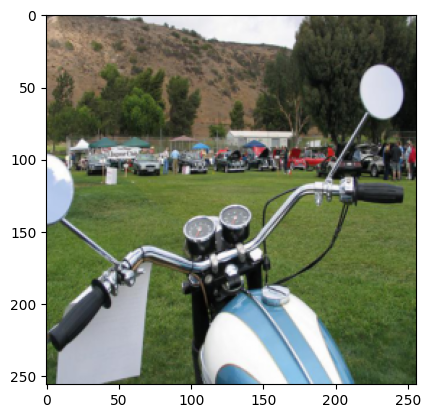

In [ ]:
plt.imshow(img[0].permute(1,2,0).to(torch.device('cpu')))

In [ ]:
from torch.nn import functional as F

class ConvDenoiser(nn.Module):
  def __init__(self):
    super(ConvDenoiser,self).__init__()
    self.conv1 = nn.Conv2d(3,512,3,padding=1)
    self.conv2 = nn.Conv2d(512,256,3,padding=1)
    self.conv3 = nn.Conv2d(256,128,3,padding=1)
    self.pool = nn.MaxPool2d(2,2)

    self.t_conv1 = nn.ConvTranspose2d(128,128,2,stride=2)
    self.t_conv2 = nn.ConvTranspose2d(128,256,2,stride=2)
    self.t_conv3 = nn.ConvTranspose2d(256,256,2,stride=2)
    self.conv_out = nn.Conv2d(256,3,3,padding=1)
  
  def forward(self,x):
    #encode
    x = F.relu(self.conv1(x))
    x = self.pool(x)
    x = F.relu(self.conv2(x))
    x = self.pool(x)
    x = F.relu(self.conv3(x))
    x = self.pool(x)
    #decode
    x = F.relu(self.t_conv1(x))
    x = F.relu(self.t_conv2(x))
    x = F.relu(self.t_conv3(x))
    x = F.sigmoid(self.conv_out(x))
    return x

model = ConvDenoiser().to(device)
print(model)


ConvDenoiser(
  (conv1): Conv2d(3, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (t_conv1): ConvTranspose2d(128, 128, kernel_size=(2, 2), stride=(2, 2))
  (t_conv2): ConvTranspose2d(128, 256, kernel_size=(2, 2), stride=(2, 2))
  (t_conv3): ConvTranspose2d(256, 256, kernel_size=(2, 2), stride=(2, 2))
  (conv_out): Conv2d(256, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
)


In [ ]:
# with torch.no_grad():
#   out = model(train[0].to(device))
#   print(out.shape)

In [ ]:
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(),lr=.001)

In [ ]:
n_epochs = 10
noise_factor = .28

for e in range(n_epochs):
  train_loss = 0.0
  for data in train_dl:
    noisy_img = data + noise_factor * torch.randn(*data.shape)
    noisy_img = np.clip(noisy_img,0,1)
    # print(noisy_img[0].shape,type(noisy_img[0]))
    
    optimizer.zero_grad()
    out = model(noisy_img.to(device))
    # data = data.to(device)
    loss = criterion(out,data.cuda())
    loss.backward()
    optimizer.step()
    train_loss += loss.item()*data.size(0)
  train_loss  = train_loss/len(train_dl)
  print(f'Epoch {e}\tLoss:{train_loss}') 

Epoch 0	Loss:0.13735137328505517
Epoch 1	Loss:0.05648303289711475
Epoch 2	Loss:0.04896353915333748
Epoch 3	Loss:0.04557976854592562
Epoch 4	Loss:0.04402526296675205
Epoch 5	Loss:0.0386950064599514
Epoch 6	Loss:0.03688375321775675
Epoch 7	Loss:0.036028364397585395
Epoch 8	Loss:0.03416894584149122
Epoch 9	Loss:0.034279184021055696


In [ ]:
torch.save(model.state_dict(),'/content/denoisingCoco_AE.pth')

In [ ]:
tst = iter(test)
data = []
for i in range(10):
  data.append(next(tst))


torch.Tensor

torch.Size([3, 256, 256])


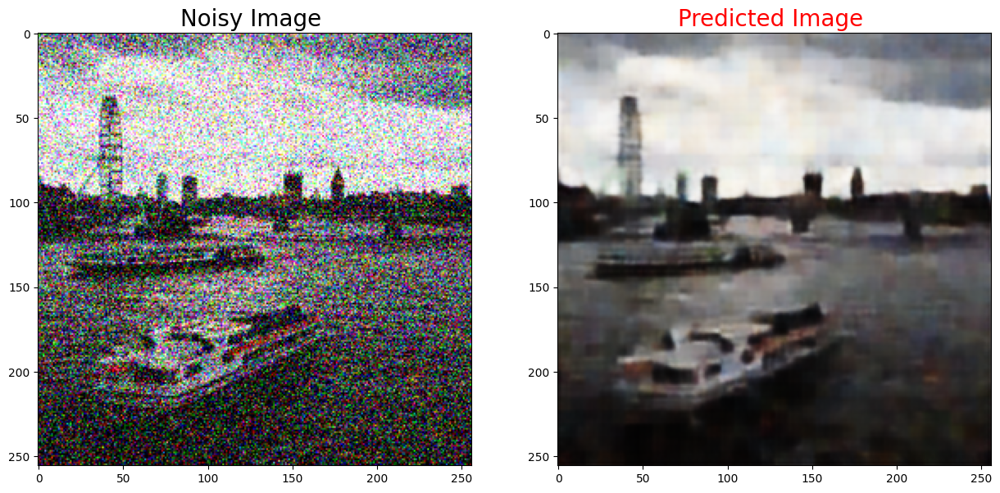

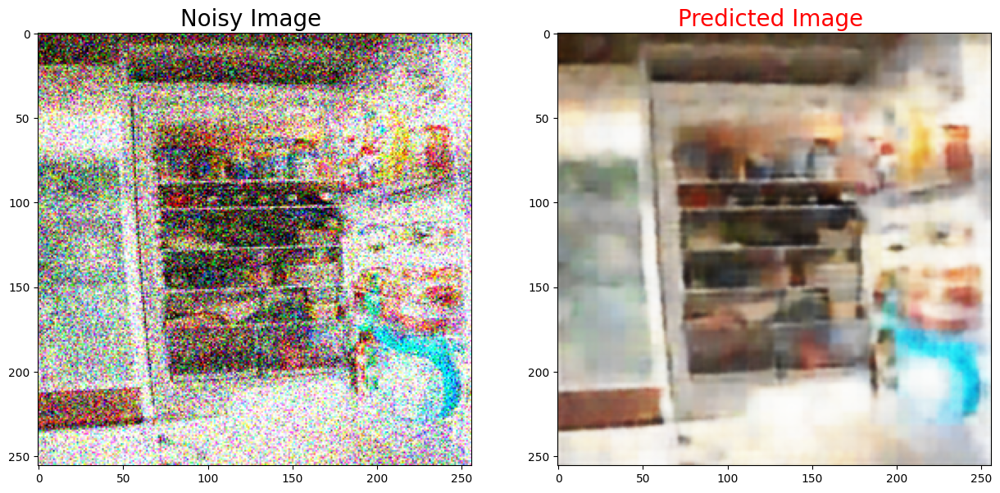

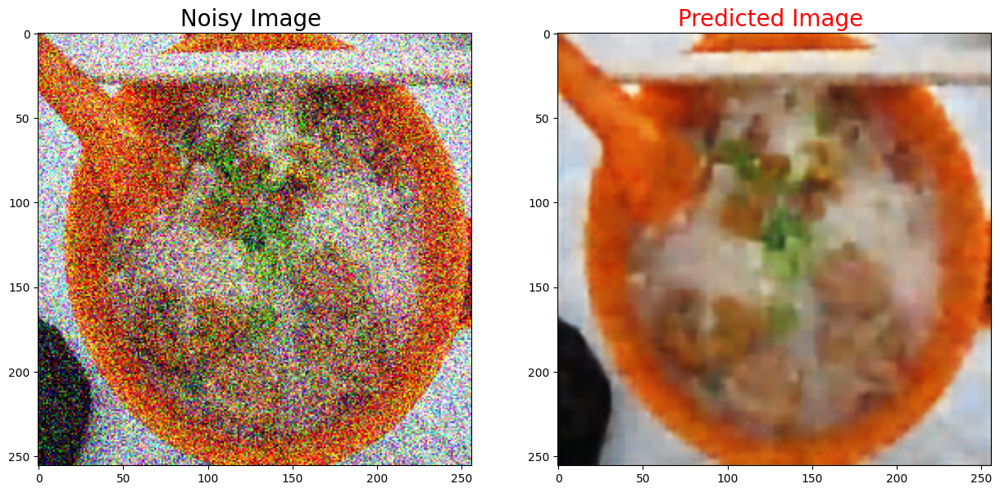

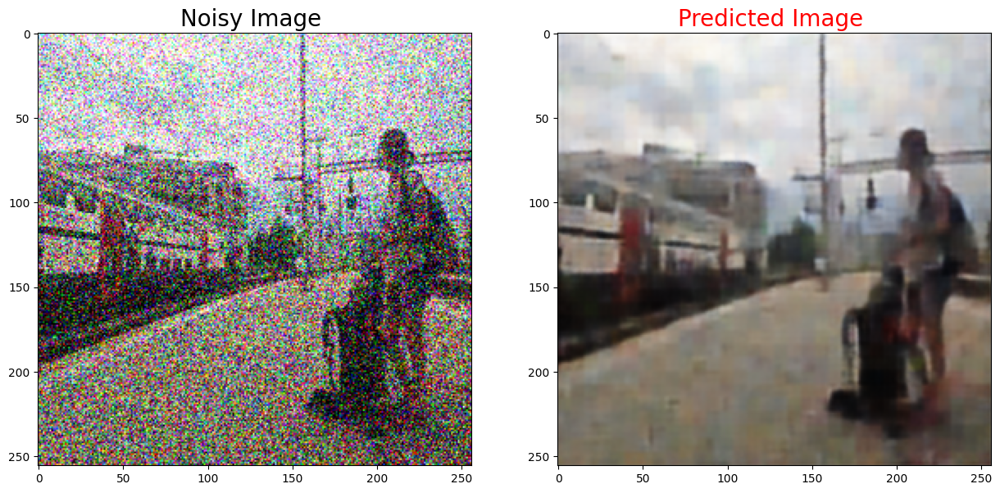

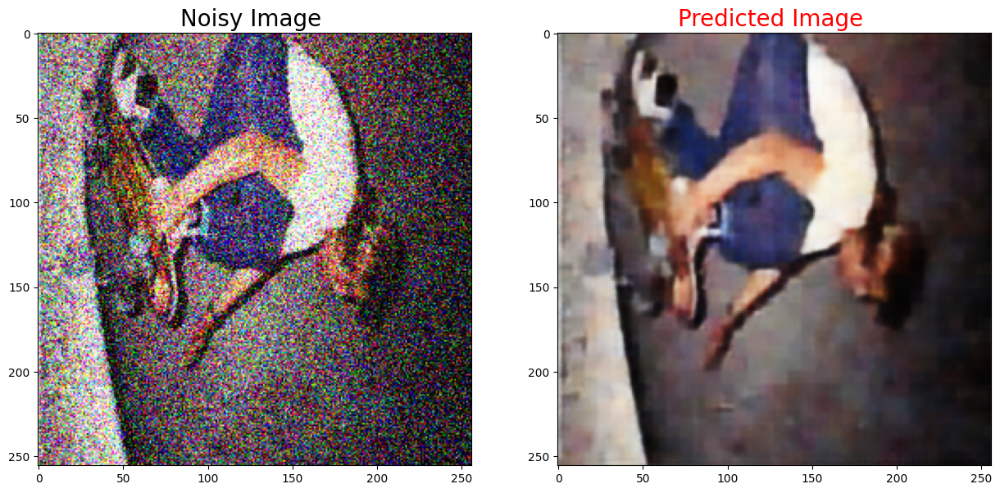

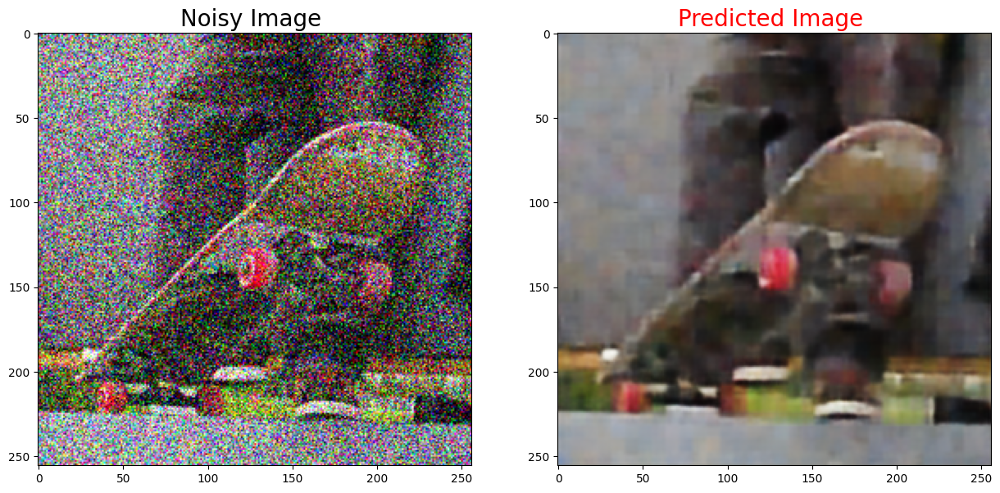

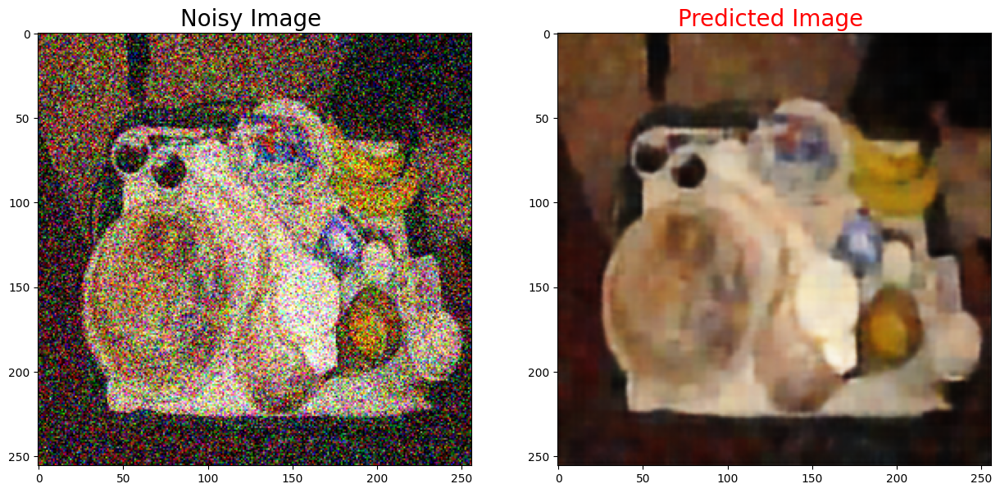

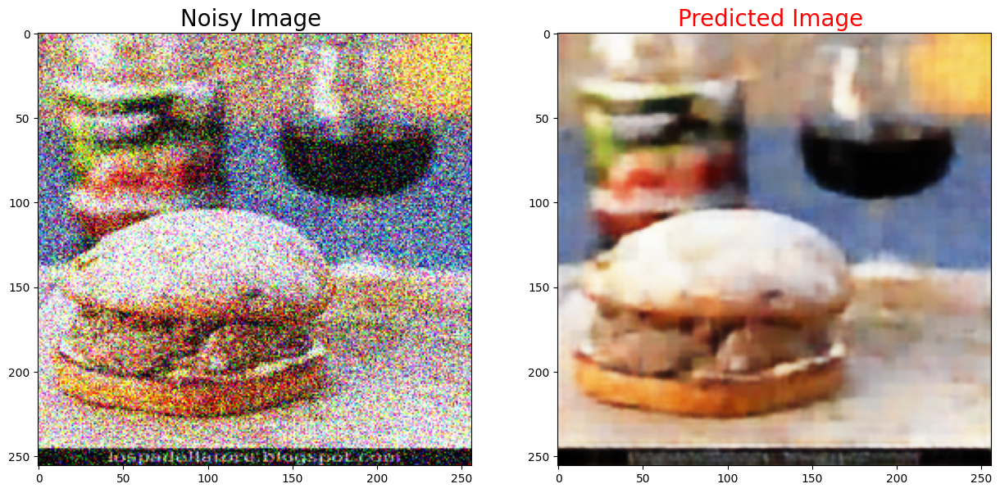

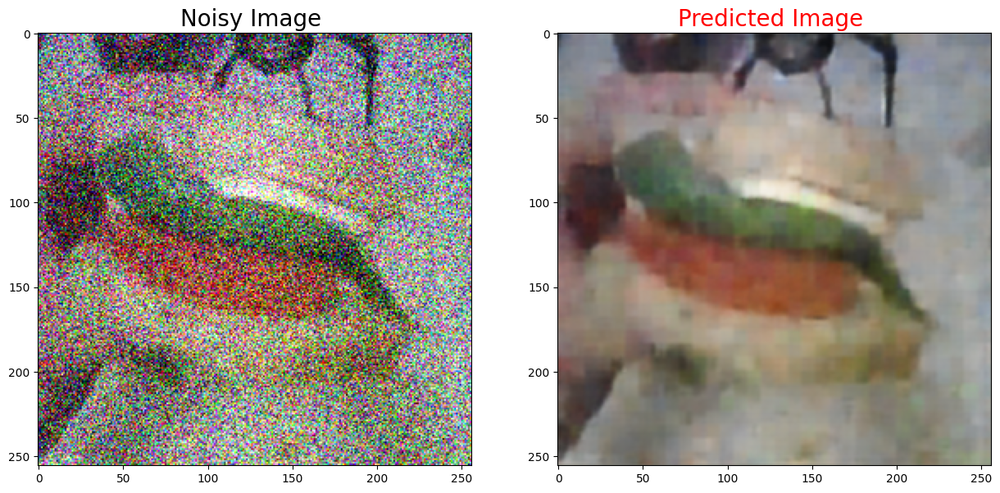

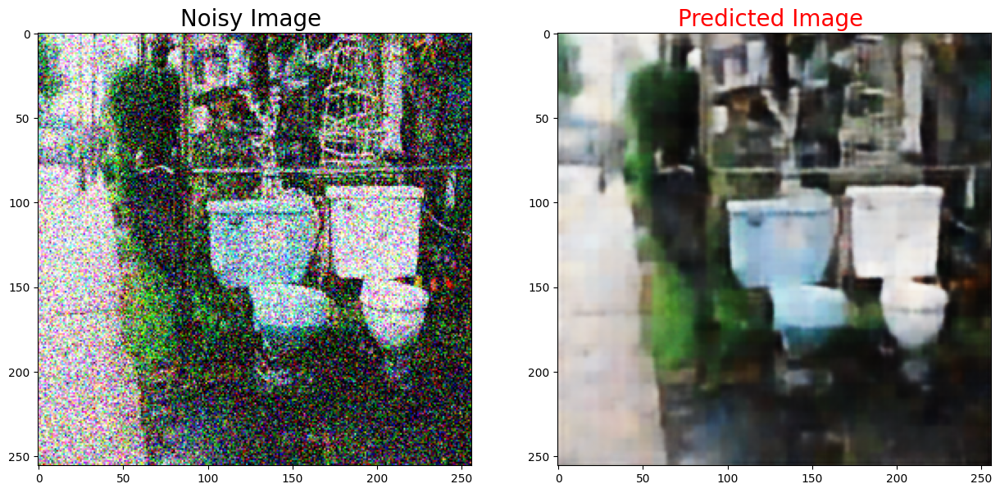

In [ ]:
def plot_images(grayscale,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,2,1)

    plt.title('Noisy Image ', color = 'black', fontsize = 20)
    plt.imshow(grayscale)
    plt.subplot(1,2,2)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)   
    plt.show()

for i,o in zip(noisy_imgs,output):

    plot_images(i.permute(1,2,0),o.detach().numpy().transpose((1,2,0)))